In [14]:
import os
import openpyxl
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from openpyxl.utils import get_column_letter
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torchinfo import summary

In [18]:
ruta_carpeta = "/Users/Usuario/OneDrive/Escritorio/tfg/probeta 1/"
num_ensayos=11
nombres_archivos = [f"ENSAYO_{i}.xlsx" for i in range(num_ensayos)]

# Intervalo de frecuencias de cada canal
intervalo_canales = [
    (4, 804),      
    (810, 1610),   
    (1616, 2416),
    (2422, 3222),
    #(3228, 4028), Nos saltamos el sensor 5
    (4034, 4834),
    (4840, 5640),
    (5646, 6446),
    (6452, 7252),
    (7258, 8058)
]
# Definir las columnas de frecuencia, parte real y parte imaginaria para cada rango
frecuencia_col = [1, 4, 7, 10, 13, 16, 19, 22, 25]  # A, D, J
real_col = [2, 5, 8, 11, 14, 17, 20, 23, 26]  # B, E, K
imagin_col = [3, 6, 9, 12, 15, 18, 21, 24, 27]  # C, F, L
# Convertimos estas a letras para el print
frecuencia_col_letras = [get_column_letter(col) for col in frecuencia_col]
real_col_letras = [get_column_letter(col) for col in real_col]
imagin_col_letras = [get_column_letter(col) for col in imagin_col]

In [46]:
# Obtenemos las partes reales e imagin separadas por ensayo, hojas, canales y rangos
data_frecuencias = []
data_partes_reales = []
data_partes_imagin = []
for ensayo_idx, nombre_archivo in enumerate(nombres_archivos):
    ruta_archivo = os.path.join(ruta_carpeta, nombre_archivo)
    wb = openpyxl.load_workbook(ruta_archivo)

    sweep1=wb['Sweep_1']
    sweep2=wb['Sweep_2']
    sweep3=wb['Sweep_3']
    
    sweeps = [sweep1, sweep2, sweep3]
    
    if ensayo_idx == 0:  # Solo se almacena una vez porque las frecuencias no cambian entre ensayos
        for col in frecuencia_col:
            column_data = [sweeps[0].cell(row=i, column=col).value for i in range(4, 805)]
            data_frecuencias.append(column_data)

    ensayo_partes_reales = []
    ensayo_partes_imagin = []
    
    for sheet in sweeps:
        sweep_data_reales = []
        sweep_data_imagin = []
        for inicio, fin in intervalo_canales:
            canal_data_reales = []
            canal_data_imagin = []
            for col_r, col_i in zip(real_col, imagin_col):
                column_data_reales = [sheet.cell(row=i, column=col_r).value for i in range(inicio, fin + 1)]
                column_data_imagin = [sheet.cell(row=i, column=col_i).value for i in range(inicio, fin + 1)]
                canal_data_reales.append(column_data_reales)
                canal_data_imagin.append(column_data_imagin)
            sweep_data_reales.append(canal_data_reales)
            sweep_data_imagin.append(canal_data_imagin)
        ensayo_partes_reales.append(sweep_data_reales)
        ensayo_partes_imagin.append(sweep_data_imagin)
    data_partes_reales.append(ensayo_partes_reales)
    data_partes_imagin.append(ensayo_partes_imagin)

In [20]:
# Ahora, imprimir las partes reales y las imaginarias para comprobar la estructura
# print("\nPartes Reales y Partes Imaginarias:")

# Recorremos los datos de partes reales e imaginarias
# for ensayo_idx, (sweep_reales, sweep_imagin) in enumerate(zip(data_partes_reales, data_partes_imagin), start=1):
#     print(f"\nEnsayo {ensayo_idx-1}:")
#     for sweep_idx, (sweep_data_reales, sweep_data_imagin) in enumerate(zip(sweep_reales, sweep_imagin), start=1):
#         print(f"  Barrido {sweep_idx}:")
        
#         for canal_idx, (canal_reales, canal_imagin) in enumerate(zip(sweep_data_reales, sweep_data_imagin), start=1):
#             print(f"    Canal {canal_idx}:")
#             for col_idx, (column_reales, column_imagin) in enumerate(zip(canal_reales, canal_imagin), start=1):
#                 print(f"      Columna {real_col_letras[col_idx-1]}:")
#                 print(f"        Parte Real (primeros 5 valores): {column_reales[:5]}")
#                 print(f"        Parte Imaginaria (primeros 5 valores): {column_imagin[:5]}")


In [58]:
data_frecuencias_np = np.array(data_frecuencias)
data_partes_reales_np = np.array(data_partes_reales)
data_partes_imagin_np = np.array(data_partes_imagin)

In [59]:
print(data_frecuencias_np.shape)
print(data_partes_reales_np.shape)
print(data_partes_imagin_np.shape)

(9, 801)
(11, 3, 9, 9, 801)
(11, 3, 9, 9, 801)


In [60]:
data_partes_reales_np_vis = data_partes_reales_np.reshape(data_partes_reales_np.shape[0], data_partes_reales_np.shape[1], data_partes_reales_np.shape[2], -1)
data_partes_imagin_np_vis = data_partes_imagin_np.reshape(data_partes_imagin_np.shape[0], data_partes_imagin_np.shape[1], data_partes_imagin_np.shape[2], -1)
data_frecuencias_np_vis = data_frecuencias_np.reshape(-1)
print( data_partes_reales_np_vis.shape)
print( data_partes_imagin_np_vis.shape)
print(data_frecuencias_np_vis.shape)

(11, 3, 9, 7209)
(11, 3, 9, 7209)
(7209,)


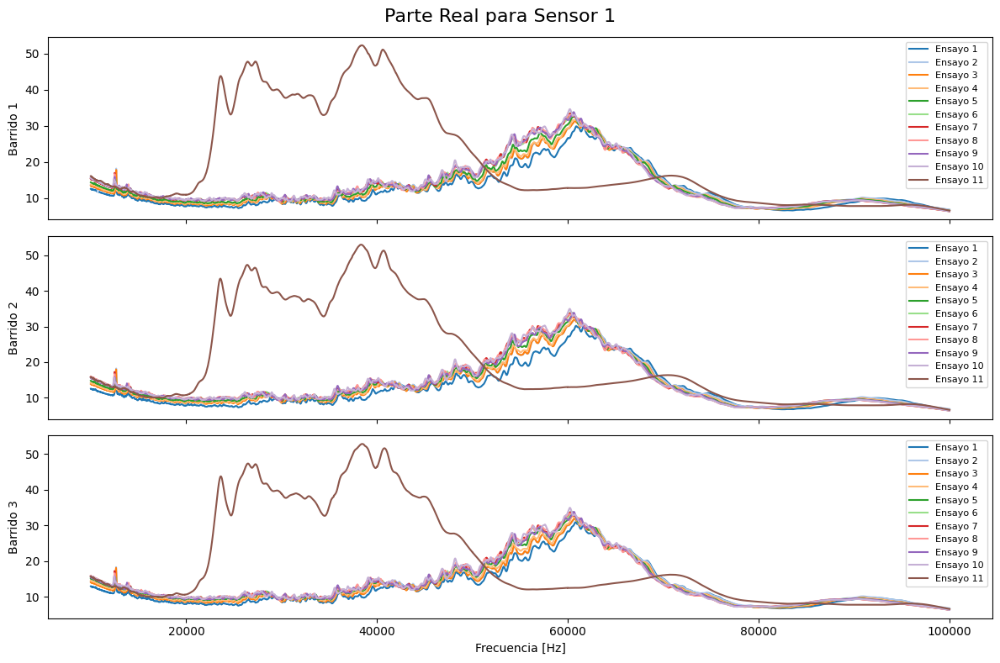

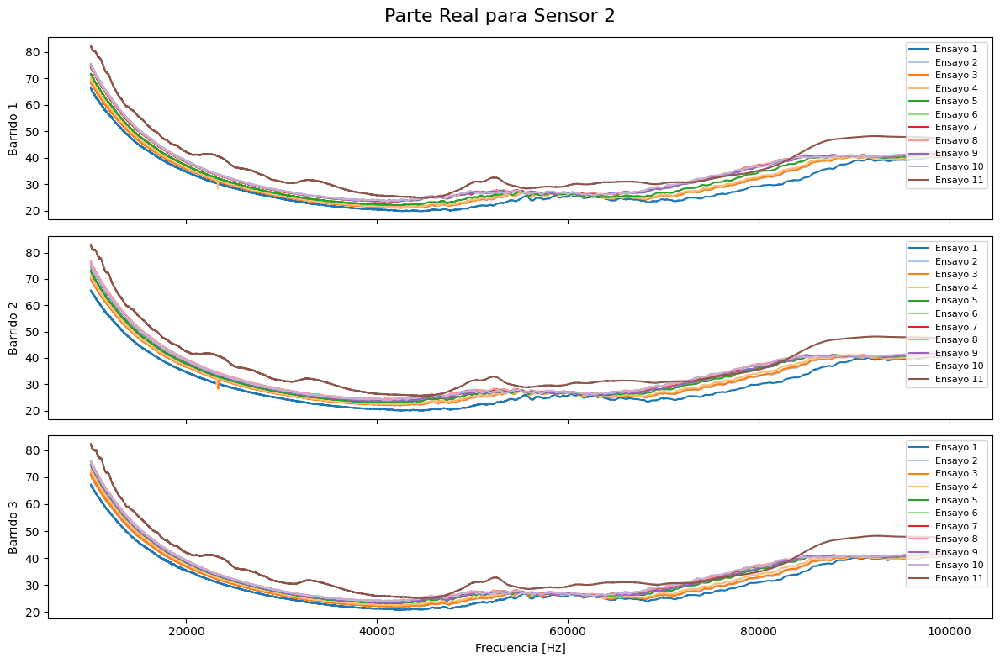

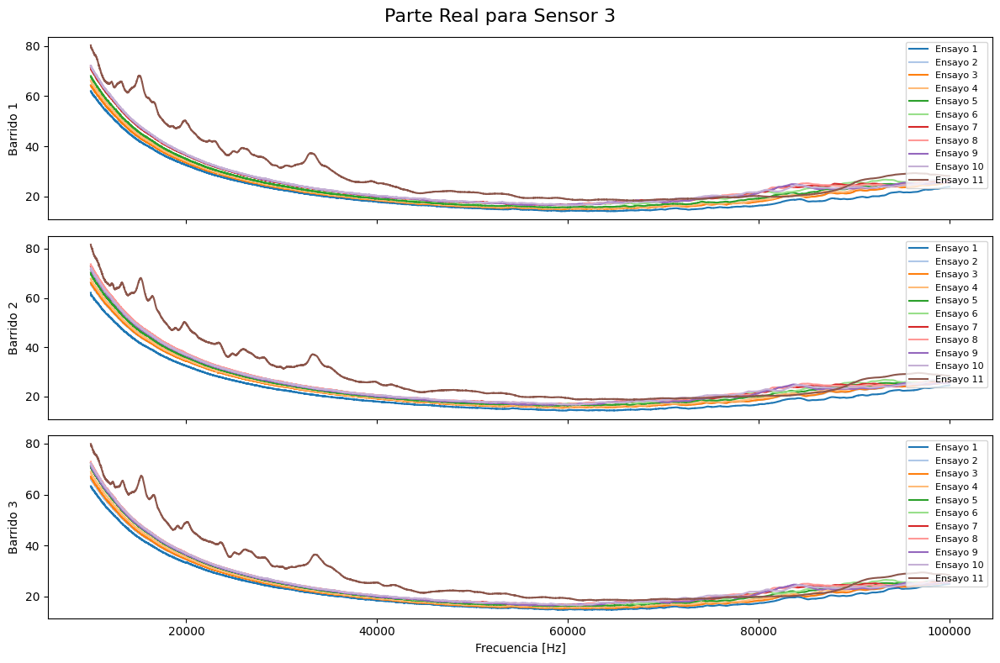

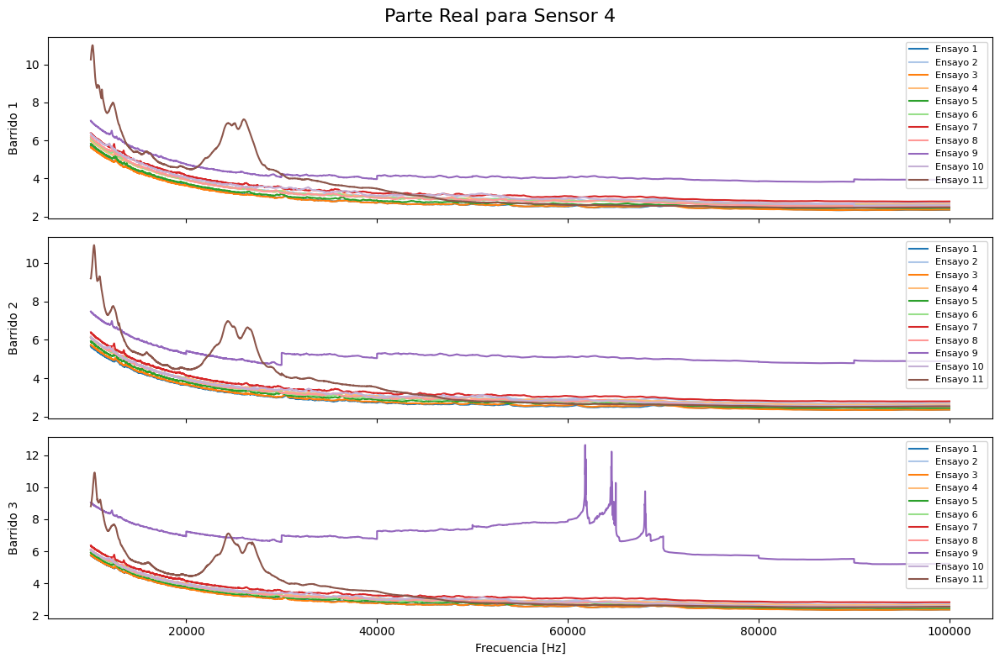

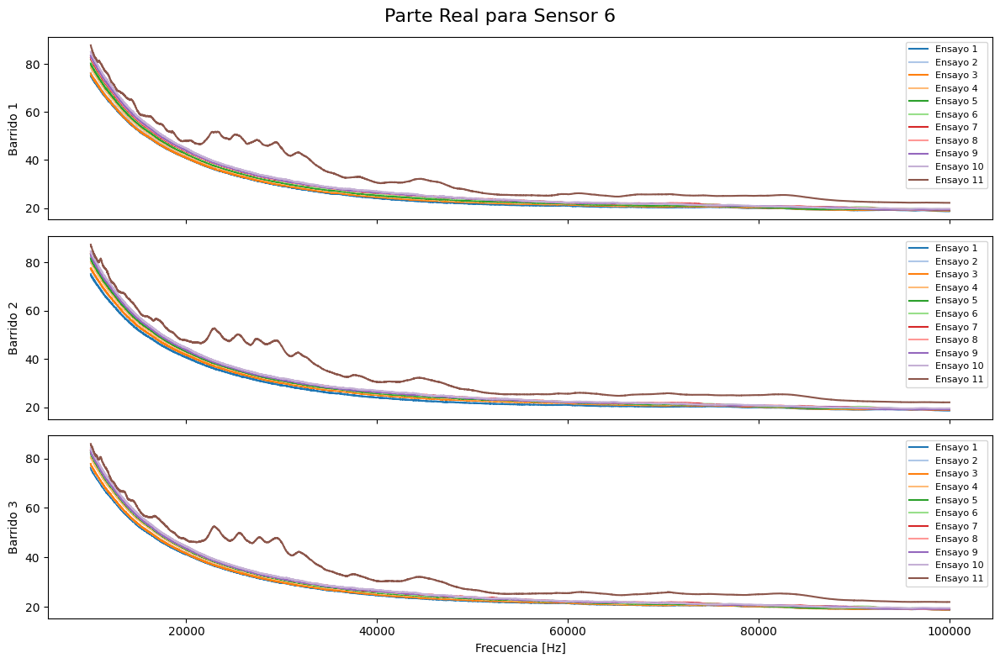

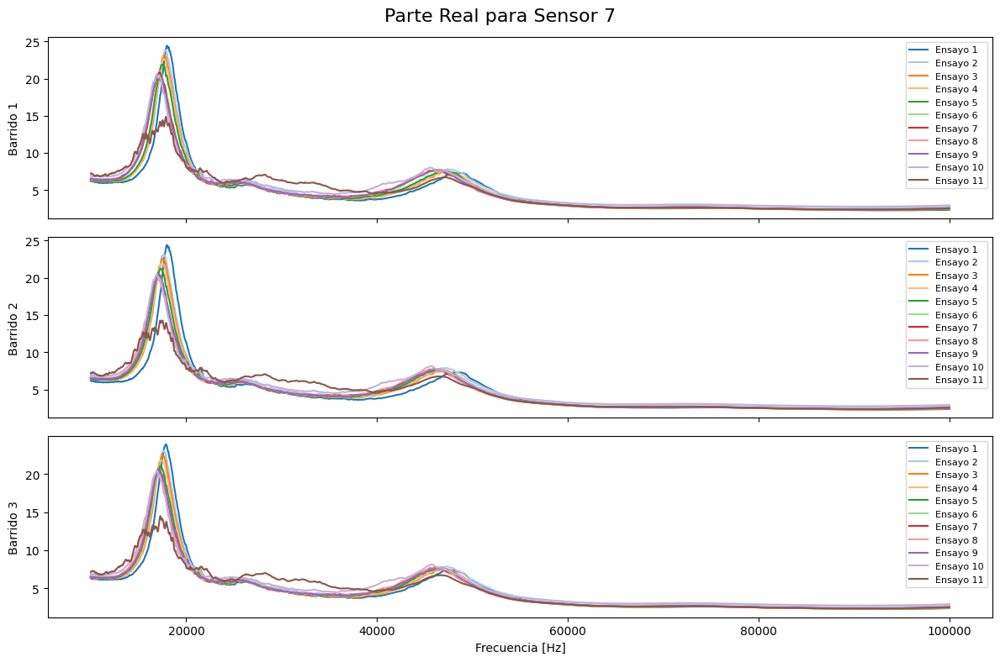

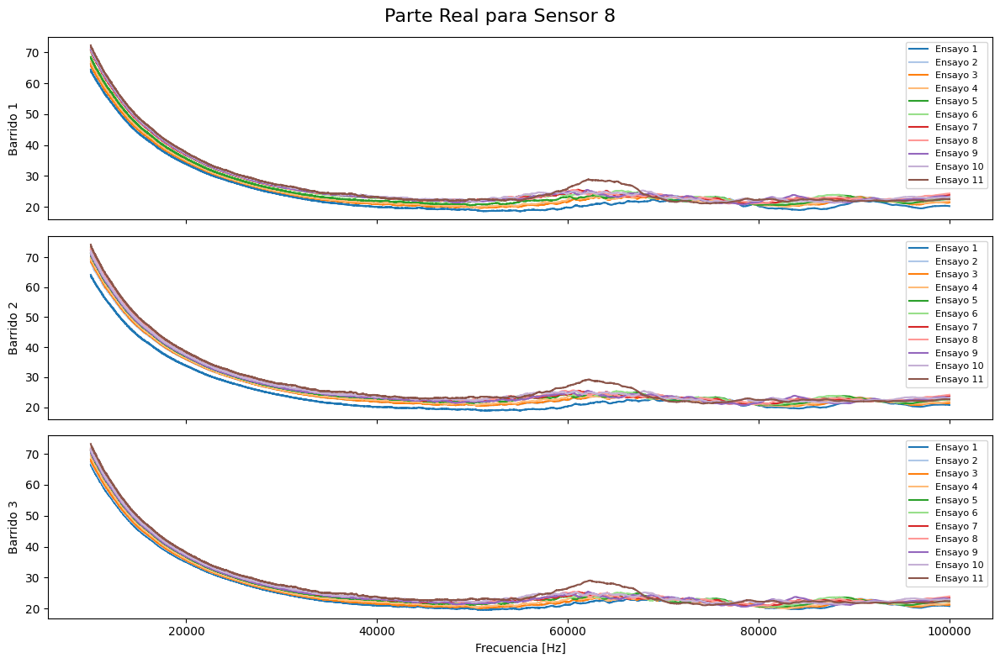

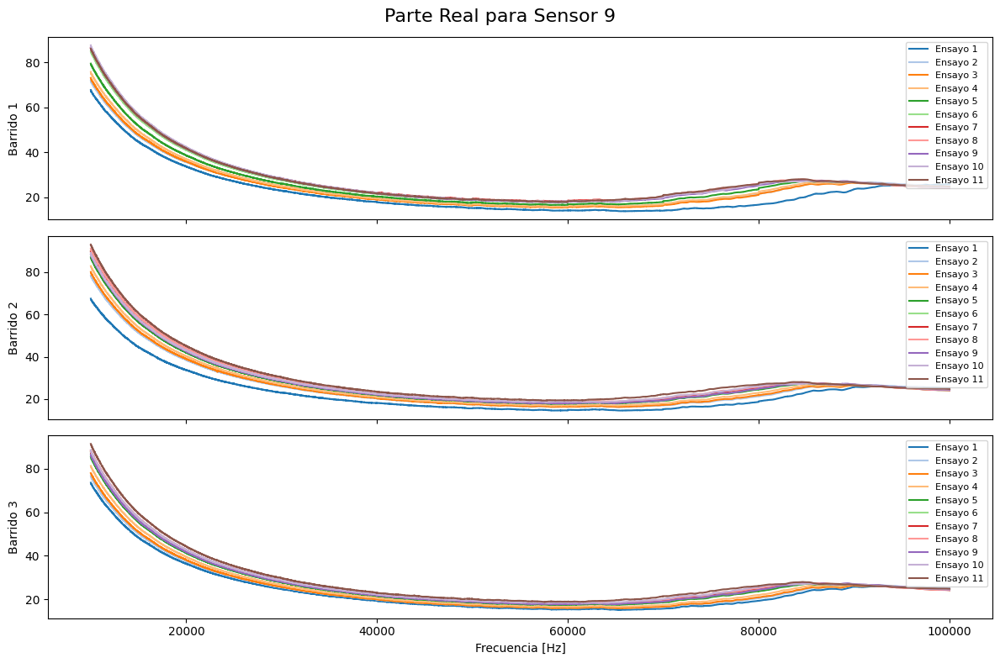

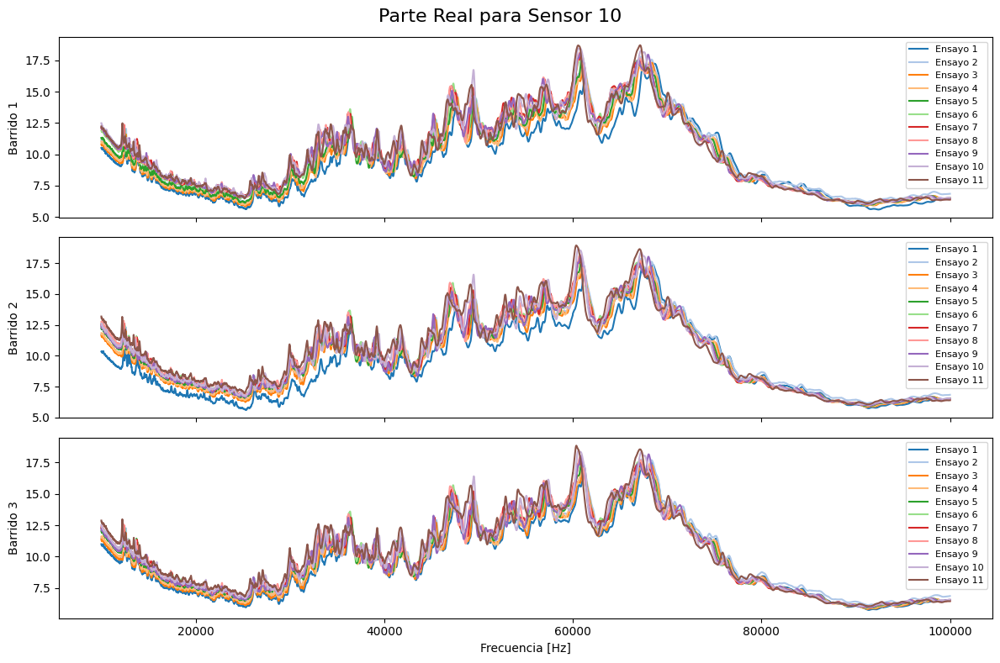

In [50]:
#VISUALIZACIÓN DE SEÑALES: Subplots de las señales separados por sensor, carga y sensor-barrido
n_ensayos, n_barridos, n_sensores, n_puntos = (11, 3, 9, 7209)
colormap = plt.get_cmap("tab20")
# Parte real
for sensor in range(n_sensores):
    fig, axs = plt.subplots(n_barridos, 1, figsize=(12, 8), sharex=True) # Creamos una figura con n_barridos subplots (uno por cada barrido).
    if sensor<4:
        fig.suptitle(f"Parte Real para Sensor {sensor+1}", fontsize=16)
    else: fig.suptitle(f"Parte Real para Sensor {sensor+2}", fontsize=16)
    
    # Iteramos sobre cada barrido
    for barrido in range(n_barridos):
        ax = axs[barrido]  
        for ensayo in range(n_ensayos):
            color = colormap(ensayo % 20)
            ax.plot(data_frecuencias_np_vis,data_partes_reales_np_vis[ensayo, barrido, sensor], label=f"Ensayo {ensayo+1}", color=color)
        
        ax.set_ylabel(f"Barrido {barrido+1}")
        ax.legend(fontsize=8, loc="upper right")
    
    axs[-1].set_xlabel("Frecuencia [Hz]")
    plt.tight_layout()
    plt.show()

In [25]:
# #Parte imaginaria
# for sensor in range(n_sensores):
#     fig, axs = plt.subplots(n_barridos, 1, figsize=(12, 8), sharex=True) # Creamos una figura con n_barridos subplots (uno por cada barrido).
#     if sensor<4:
#         fig.suptitle(f"Parte Imaginaria para Sensor {sensor+1}", fontsize=16)
#     else: fig.suptitle(f"Parte Imaginaria para Sensor {sensor+2}", fontsize=16)
    
#     # Iteramos sobre cada barrido
#     for barrido in range(n_barridos):
#         ax = axs[barrido]  
#         for ensayo in range(n_ensayos):
#             color = colormap(ensayo % 20)
#             ax.plot(data_frecuencias_np_reshaped,data_partes_imagin_np_reshaped[ensayo, barrido, sensor, :], label=f"Ensayo {ensayo+1}",color=color)
        
#         ax.set_ylabel(f"Barrido {barrido+1}")
#         ax.legend(fontsize=8, loc="upper right")
    
#     axs[-1].set_xlabel("Frecuencia [Hz]")
#     plt.tight_layout()
#     plt.show()

In [69]:
# Debido a lo visto en la visualización de los datos, descartamos las señales obtenidas por el ensayo 11 en general y las del ensayo 9 en el caso del sensor 4.
# Esta útima se elimina más adelante antes de entrenar nuestro VAE ya que ahora no se puede por incompatibilidad en el array numpy. Sin embargo nos deshacemos de ella ya en la visualización.
data_partes_reales_npf=np.delete(data_partes_reales_np, 10, axis=0)
print(data_partes_reales_npf.shape)
data_partes_imagin_npf=np.delete(data_partes_imagin_np, 10, axis=0)
print(data_partes_imagin_npf.shape)

(10, 3, 9, 9, 801)
(10, 3, 9, 9, 801)


In [70]:
data_partes_reales_npf_vis = data_partes_reales_npf.reshape(data_partes_reales_npf.shape[0], data_partes_reales_npf.shape[1], data_partes_reales_npf.shape[2], -1)
print(data_partes_reales_npf_vis.shape)

(10, 3, 9, 7209)


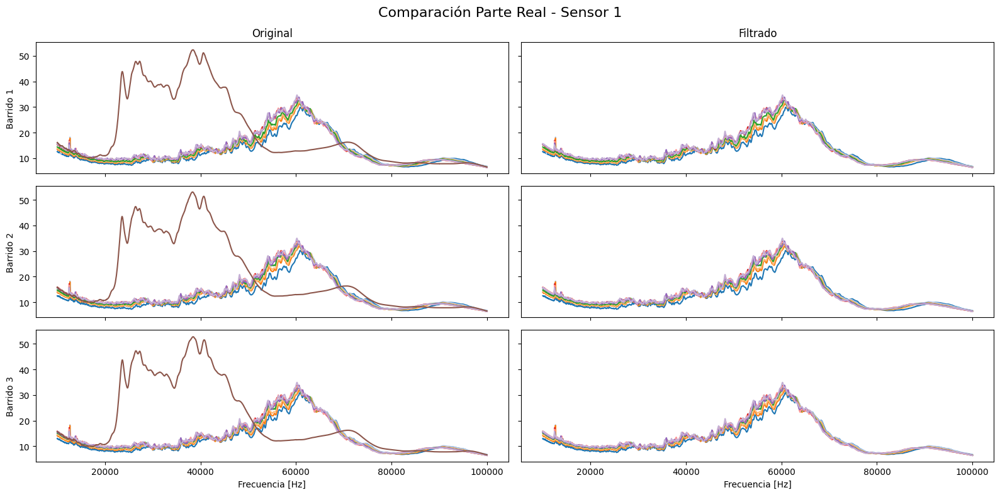

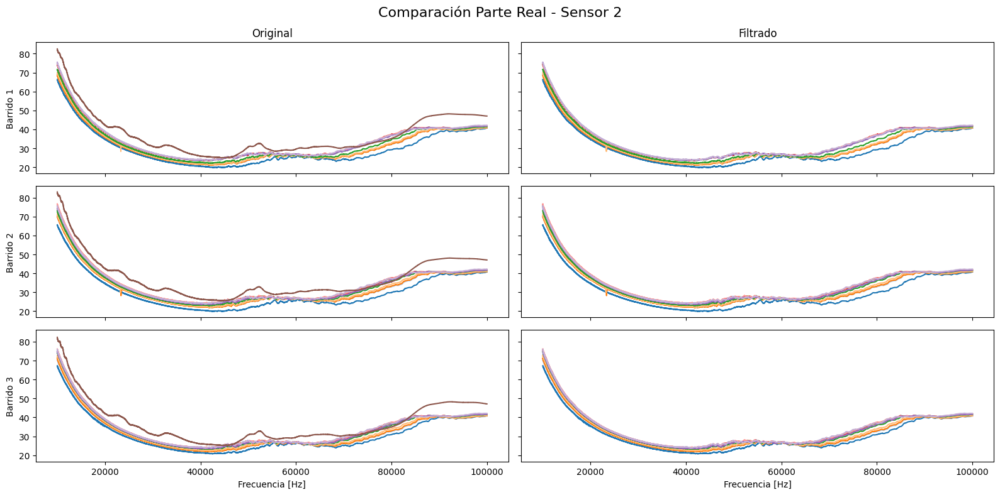

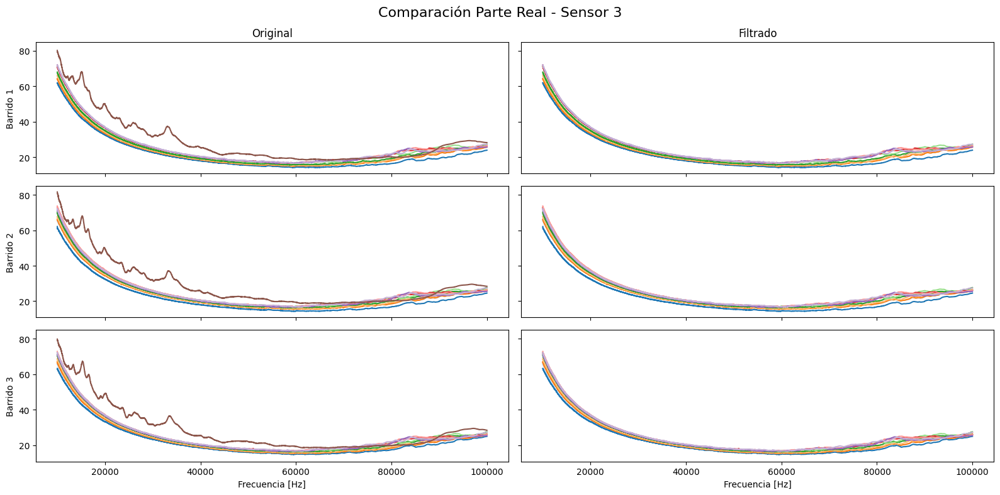

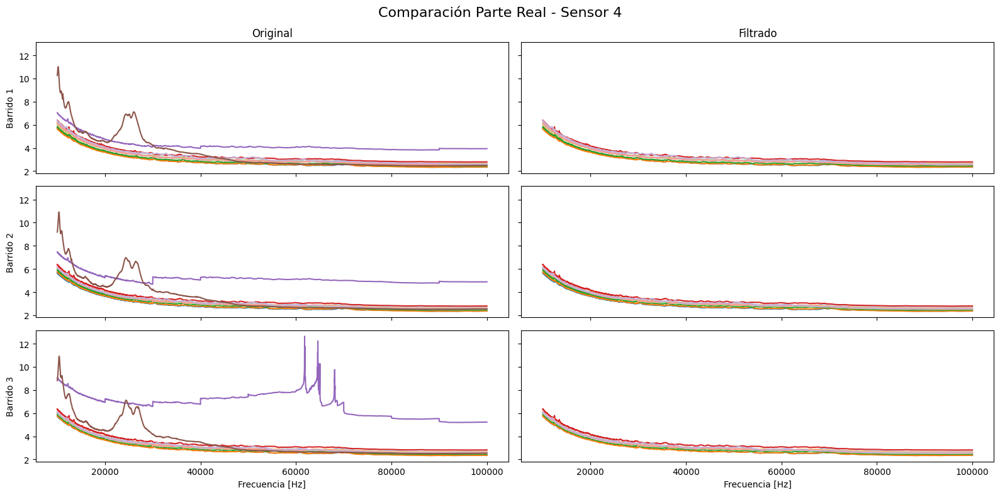

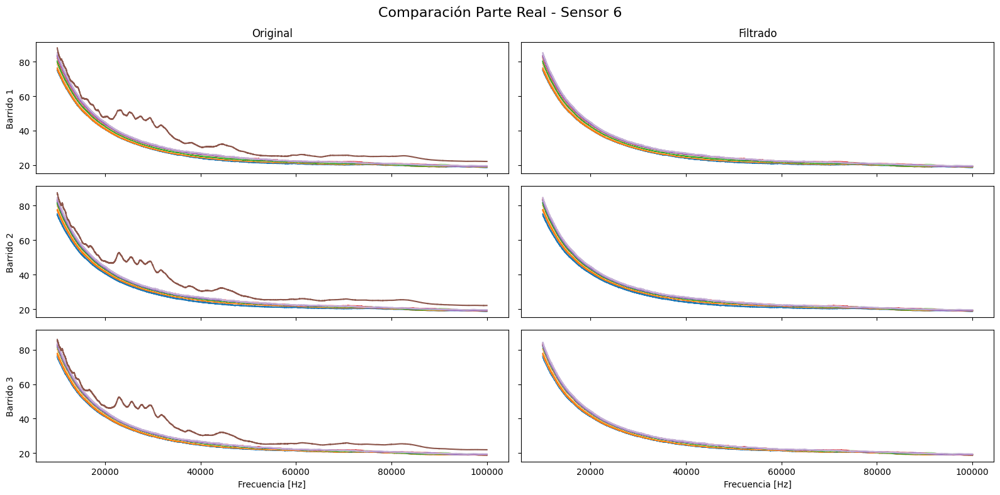

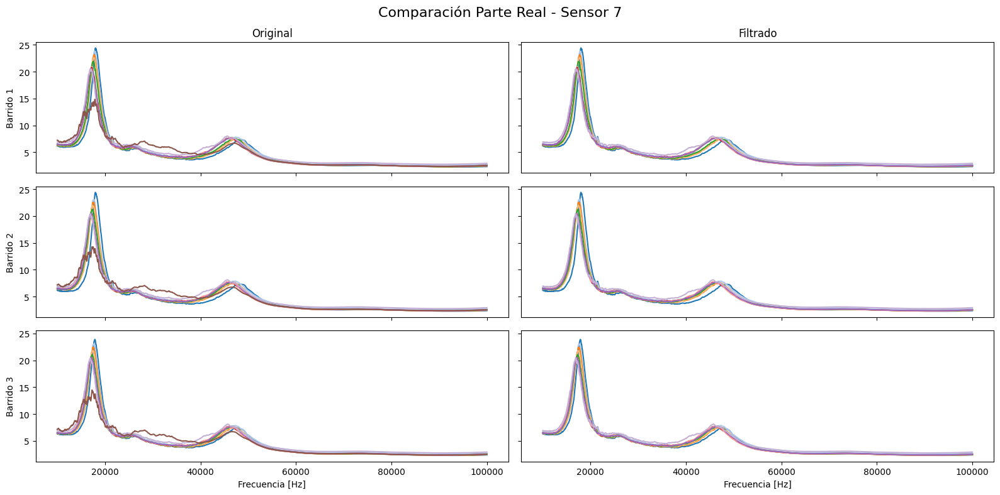

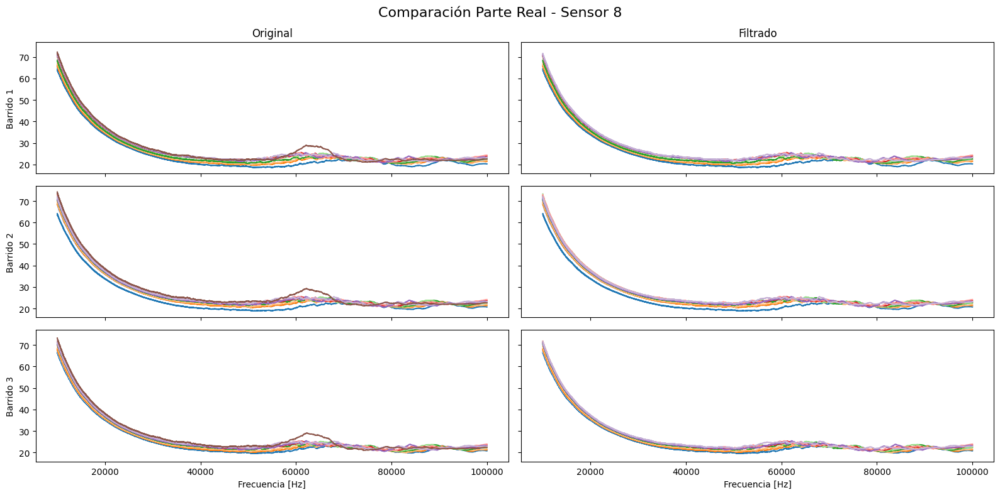

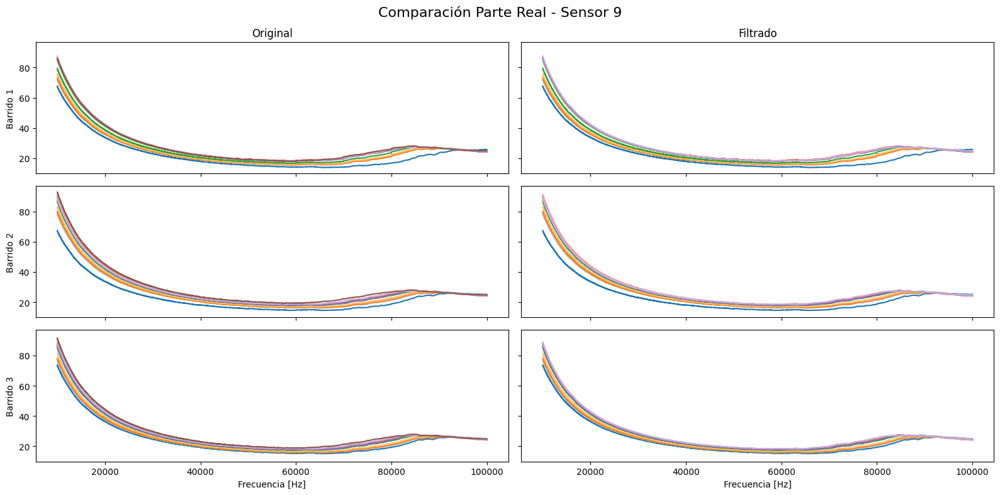

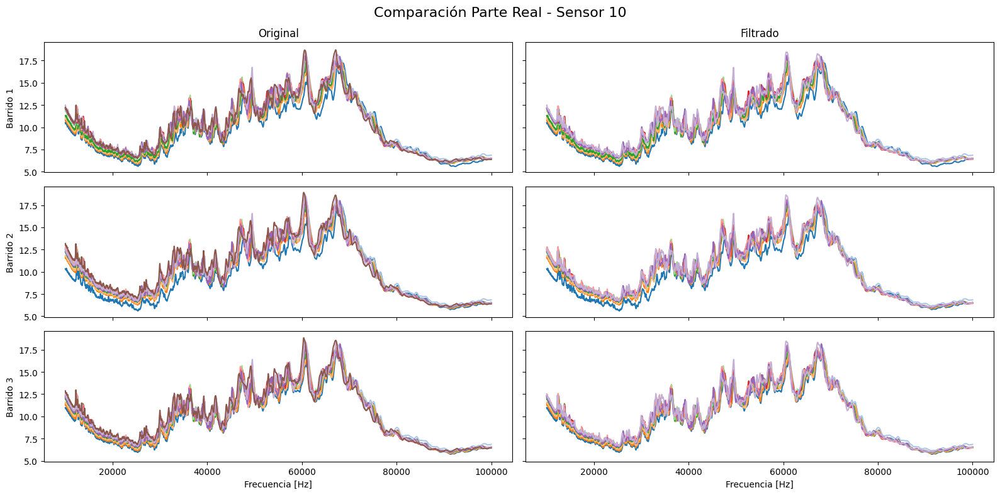

In [77]:
# VISUALIZACIÓN COMPARATIVA
# ---------------------------
n_ensayos_orig, n_barridos, n_sensores, n_puntos = (11, 3, 9, 7209)
n_ensayos_edit = 10
colormap = plt.get_cmap("tab20")

for sensor in range(n_sensores):
    fig, axs = plt.subplots(n_barridos, 2, figsize=(16, 8), sharex=True, sharey=True)  
    # 2 columnas: izquierda original, derecha editada

    if sensor < 4:
        fig.suptitle(f"Comparación Parte Real - Sensor {sensor+1}", fontsize=16)
    else:
        fig.suptitle(f"Comparación Parte Real - Sensor {sensor+2}", fontsize=16)

    for barrido in range(n_barridos):
        # --- Columna izquierda: señales originales ---
        ax_left = axs[barrido, 0]
        for ensayo in range(n_ensayos_orig):
            color = colormap(ensayo % 20)
            ax_left.plot(data_frecuencias_np_vis, 
                         data_partes_reales_np_vis[ensayo, barrido, sensor], 
                         label=f"Ensayo {ensayo+1}", color=color)
        ax_left.set_ylabel(f"Barrido {barrido+1}")
        if barrido == 0:
            ax_left.set_title("Original")

        # --- Columna derecha: señales editadas ---
        ax_right = axs[barrido, 1]
        for ensayo in range(n_ensayos_edit):
            if ensayo == 8 and sensor == 3:  # saltar sensor 4 en ensayo 9
                continue
            color = colormap(ensayo % 20)
            ax_right.plot(data_frecuencias_np_vis, 
                          data_partes_reales_npf_vis[ensayo, barrido, sensor], 
                          label=f"Ensayo {ensayo+1}", color=color)
        if barrido == 0:
            ax_right.set_title("Filtrado")

    axs[-1, 0].set_xlabel("Frecuencia [Hz]")
    axs[-1, 1].set_xlabel("Frecuencia [Hz]")

    plt.tight_layout()
    plt.show()


In [78]:
data_partes_reales_np_reshaped=data_partes_reales_npf.reshape(10, 3, 9, 81, 89)
data_partes_reales_np_reshaped.shape

(10, 3, 9, 81, 89)

In [79]:
data_partes_imagin_np_reshaped=data_partes_imagin_npf.reshape(10, 3, 9, 81, 89)
data_partes_imagin_np_reshaped.shape

(10, 3, 9, 81, 89)

In [80]:
data_partes_reales_tensor = torch.tensor(data_partes_reales_np_reshaped, dtype=torch.float32)
data_partes_imagin_tensor = torch.tensor(data_partes_imagin_np_reshaped, dtype=torch.float32)
freqs_tensor = torch.tensor(data_frecuencias_np_vis, dtype=torch.float32)
torch.save(data_partes_reales_tensor, 'tensor_emis_real_corto.pt')
torch.save(data_partes_imagin_tensor, 'tensor_emis_imagin_corto.pt')
torch.save(freqs_tensor, 'freqs_emis_corto.pt')

In [15]:
data_partes_reales_tensor=torch.load('tensor_emis_real_corto.pt')
data_partes_imagin_tensor=torch.load('tensor_emis_imagin_corto.pt')
freqs_tensor=torch.load('freqs_emis_corto.pt')

# Definición del Autoencoder Variacional (VAE)
class VariationalAutoencoder(nn.Module):
    def __init__(self, latent_dim):
        super().__init__()
        self.latent_dim = latent_dim
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv1d(1, 16, 3, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv1d(16, 16, 3, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv1d(16, 32, 3, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv1d(32, 32, 3, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv1d(32, 64, 3, stride=2, padding=2),
            nn.ReLU(),
            nn.Conv1d(64, 64, 3, stride=2, padding=2),
            nn.ReLU()
        )
        
       # Obtener tamaño de salida del encoder dinámicamente
        with torch.no_grad():
            sample_input = torch.randn(1, 1, 89)
            sample_cat = torch.randn(1,81)
            sample_output = self.encoder(sample_input)
            encoded_dim = sample_output.numel() // sample_output.shape[0]
            # print(encoded_dim)

        self.fc_mu = nn.Linear(encoded_dim, latent_dim)
        self.fc_logvar = nn.Linear(encoded_dim, latent_dim)
        # Decoder
        self.decoder_fc = nn.Linear(latent_dim, encoded_dim)
        self.decoder = nn.Sequential(
            nn.ConvTranspose1d(64, 64, 3, stride=2, padding=2, output_padding=0),
            nn.ReLU(),
            nn.ConvTranspose1d(64, 32, 3, stride=2, padding=2, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose1d(32, 32, 3, stride=2, padding=2, output_padding=0),
            nn.ReLU(),
            nn.ConvTranspose1d(32, 16, 3, stride=2, padding=2, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose1d(16, 16, 3, stride=2, padding=2, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose1d(16, 1, 3, stride=2, padding=2),
            nn.Sigmoid()
        )
    
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    
    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)  # Aplanamos
        #print(f"Tamaño después del encoder: {x.shape}")  # Depuración
        
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        z = self.reparameterize(mu, logvar)
        
        x = self.decoder_fc(z).view(x.size(0), 64, -1)
        x = self.decoder(x)
        return x, mu, logvar

In [16]:
print(data_partes_reales_tensor.shape)
print(data_partes_imagin_tensor.shape)

torch.Size([10, 3, 9, 81, 89])
torch.Size([10, 3, 9, 81, 89])


In [17]:
latent_dim=2
model = VariationalAutoencoder(latent_dim)
summary(model, input_size=(64, 1, 89))

Layer (type:depth-idx)                   Output Shape              Param #
VariationalAutoencoder                   [64, 1, 89]               --
├─Sequential: 1-1                        [64, 64, 4]               --
│    └─Conv1d: 2-1                       [64, 16, 46]              64
│    └─ReLU: 2-2                         [64, 16, 46]              --
│    └─Conv1d: 2-3                       [64, 16, 24]              784
│    └─ReLU: 2-4                         [64, 16, 24]              --
│    └─Conv1d: 2-5                       [64, 32, 13]              1,568
│    └─ReLU: 2-6                         [64, 32, 13]              --
│    └─Conv1d: 2-7                       [64, 32, 8]               3,104
│    └─ReLU: 2-8                         [64, 32, 8]               --
│    └─Conv1d: 2-9                       [64, 64, 5]               6,208
│    └─ReLU: 2-10                        [64, 64, 5]               --
│    └─Conv1d: 2-11                      [64, 64, 4]               12,352
│

In [18]:
learning_rate = 1e-3 # Determina qué tan grandes son los ajustes en los parámetros del modelo después de cada lote o época.
batch_size = 64 # Es la cantidad de datos que se pasan por la red antes de actualizar los parámetros
epochs = 100 # Una época es una pasada completa por todo el dataset de entrenamiento
def loss_fn(outputs, inputs, mu, logvar,beta=0.05):
    mse = (outputs - inputs) ** 2  # Calcula el error cuadrático

    # Reducción lotes/muestras con mean
    loss_0= torch.mean(mse, dim=0)
    
    # Reducción secuencia/longitud con sum
    loss_2 = torch.sum(mse, dim=2)
    
    recon_loss = torch.sum(loss_2) + torch.sum(loss_0)
    
    kl_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + beta * kl_divergence
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [19]:
# def loss_fn_std(outputs, inputs, mu, logvar, beta=0.05):
#     """
#     Loss tipo VAE basada en tu versión original,
#     pero ponderada por la desviación estándar de la señal.
#     """
#     # Error cuadrático
#     mse = (outputs - inputs) ** 2  # shape [batch, 1, seq_len]

#     # Calculamos la desviación estándar por muestra (dim=2, longitud)
#     std_factor = torch.std(inputs, dim=2, keepdim=True) + 1e-6  # evitar división por 0

#     # Multiplicamos el error cuadrático por la desviación estándar
#     mse_std = mse * std_factor

#     # Reducción batch/muestras con mean
#     loss_0 = torch.mean(mse_std, dim=0)  # shape [1, seq_len]

#     # Reducción secuencia/longitud con sum
#     loss_2 = torch.sum(mse_std, dim=2)   # shape [batch, 1]

#     # Reconstrucción: suma de ambas reducciones
#     recon_loss = torch.sum(loss_2) + torch.sum(loss_0)

#     # KL divergence
#     kl_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

#     return recon_loss + beta * kl_divergence


In [20]:
def scale_signal(signal):
    # signal: tensor [num_channels, sequence_length] o [batch, L]
    min_val = signal.min(dim=-1, keepdim=True)[0]
    max_val = signal.max(dim=-1, keepdim=True)[0]
    scaled = (signal - min_val) / (max_val - min_val + 1e-8)
    return scaled

In [21]:
# Preparar los datos para DataLoader
# Reestructurar los tensores para que tengan la forma [num_samples, num_channels, sequence_length]
data=data_partes_reales_tensor.view(-1, 1, 89)
print(loads.shape)

torch.Size([21870, 1, 89])


In [22]:
# ---- Eliminar ensayo 9 (ensayo_local=7) y sensor 4 (sensor=3) ----
indices_a_eliminar = []
ensayo_local = 8  # ensayo 9 en el bloque de loads
sensor = 3        # sensor 4 (indexado desde 0)

for barrido in range(3):       # 3 barridos
    for rango in range(81):    # 81 rangos
        idx = (((ensayo_local * 3 + barrido) * 9 + sensor) * 81 + rango)
        indices_a_eliminar.append(idx)

indices_a_eliminar = torch.tensor(indices_a_eliminar, dtype=torch.long)

# Crear máscara y filtrar
mask = torch.ones(loads.shape[0], dtype=torch.bool)
mask[indices_a_eliminar] = False
data_filtrado = data[mask]

print("Shape original:", loads.shape)
print("Shape filtrado:", loads_filtrado.shape)

data_scaled = scale_signal(loads_filtrado)

print(data_scaled.shape)

train_dataset = TensorDataset(data_scaled)
test_dataset = TensorDataset(data_scaled)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

Shape original: torch.Size([21870, 1, 89])
Shape filtrado: torch.Size([21627, 1, 89])
torch.Size([21627, 1, 89])


Época 1/100, Pérdida: 175.539482
Época 2/100, Pérdida: 92.848990
Época 3/100, Pérdida: 90.555839
Época 4/100, Pérdida: 89.341834
Época 5/100, Pérdida: 88.509063
Época 6/100, Pérdida: 87.590892
Época 7/100, Pérdida: 87.216767
Época 8/100, Pérdida: 86.600690
Época 9/100, Pérdida: 85.689085
Época 10/100, Pérdida: 84.868658
Época 11/100, Pérdida: 84.398100
Época 12/100, Pérdida: 83.869251
Época 13/100, Pérdida: 82.992634
Época 14/100, Pérdida: 82.873365
Época 15/100, Pérdida: 82.418839
Época 16/100, Pérdida: 81.499748
Época 17/100, Pérdida: 81.281954
Época 18/100, Pérdida: 80.599406
Época 19/100, Pérdida: 80.185146
Época 20/100, Pérdida: 79.991291
Época 21/100, Pérdida: 79.332210
Época 22/100, Pérdida: 78.610327
Época 23/100, Pérdida: 78.815914
Época 24/100, Pérdida: 78.103466
Época 25/100, Pérdida: 78.157608
Época 26/100, Pérdida: 77.553498
Época 27/100, Pérdida: 77.675856
Época 28/100, Pérdida: 76.889846
Época 29/100, Pérdida: 76.636608
Época 30/100, Pérdida: 76.411469
Época 31/100, Pérd

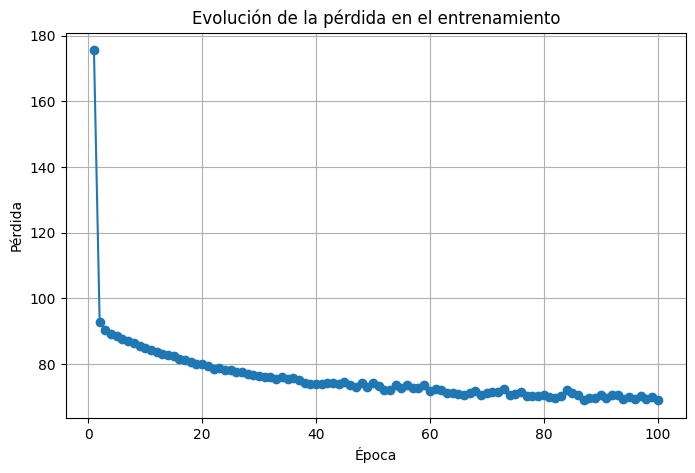

[175.5394818006888,
 92.84899031057866,
 90.55583900812815,
 89.34183391593618,
 88.50906276138576,
 87.59089187757503,
 87.2167670120149,
 86.60068995007397,
 85.68908483742257,
 84.86865837052024,
 84.3981001475859,
 83.86925128507896,
 82.99263423716528,
 82.87336465733996,
 82.41883949415218,
 81.4997475302431,
 81.28195364235421,
 80.59940592071713,
 80.18514554176105,
 79.99129118157562,
 79.33221013447236,
 78.6103267443956,
 78.81591433463012,
 78.1034660790799,
 78.15760796451005,
 77.5534980029044,
 77.67585634762014,
 76.88984601173175,
 76.63660754818888,
 76.41146857357589,
 76.04760348303078,
 76.11648936525604,
 75.41285969660832,
 76.01004926692805,
 75.40347180564022,
 75.72740351660012,
 75.16003691092045,
 74.34906870373608,
 74.12120375548594,
 74.13464743710128,
 74.10877066392165,
 74.20397551948503,
 74.20909491093201,
 74.0495251311353,
 74.55397401617829,
 73.54490684193267,
 73.22253548887355,
 74.30103706043853,
 73.17862877478966,
 74.14251380559256,
 73.338

In [23]:
# Entrenamiento del modelo
def train_model(model, train_loader, optimizer, epochs):
    losses = []
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        for batch in train_loader:
            inputs = batch[0]
            outputs, mu, logvar = model(inputs)
            loss = loss_fn(outputs, inputs, mu, logvar)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()
        avg_loss = epoch_loss / len(train_loader)
        losses.append(avg_loss)
        print(f"Época {epoch+1}/{epochs}, Pérdida: {avg_loss:.6f}")

     # ---- 📈 Graficar curva de pérdida ----
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, epochs+1), losses, marker="o", linestyle="-")
    plt.xlabel("Época")
    plt.ylabel("Pérdida")
    plt.title("Evolución de la pérdida en el entrenamiento")
    plt.grid(True)
    plt.show()

    return losses

train_model(model, train_loader, optimizer, epochs)

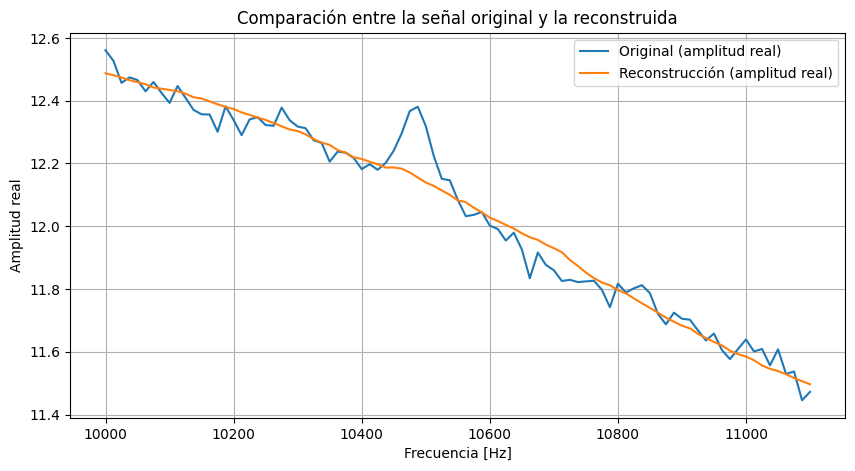

In [24]:
def evaluate_model(model, loads_scaled, loads_original, freqs_tensor):

    model.eval()
    with torch.no_grad():
        # Tomamos la primera señal (index 0)
        original_signal_scaled = loads_scaled[0]       # [1, 89]
        original_signal_real = loads_original[0]       # [1, 89]

        # Extraer las frecuencias correspondientes a esa señal
        freqs_signal = freqs_tensor[:original_signal_real.shape[-1]]  # primeros 89 valores

        # Reconstrucción
        reconstructed_scaled = model(original_signal_scaled.unsqueeze(0))[0].squeeze().detach()

        # Desnormalizar usando min y max de la señal real
        min_val = original_signal_real.min()
        max_val = original_signal_real.max()
        reconstructed_real = reconstructed_scaled * (max_val - min_val) + min_val

        # Graficar
        plt.figure(figsize=(10, 5))
        plt.plot(freqs_signal.numpy(), original_signal_real.squeeze().numpy(), label="Original (amplitud real)")
        plt.plot(freqs_signal.numpy(), reconstructed_real.numpy(), label="Reconstrucción (amplitud real)")
        plt.legend()
        plt.title("Comparación entre la señal original y la reconstruida")
        plt.xlabel("Frecuencia [Hz]")
        plt.ylabel("Amplitud real")
        plt.grid(True)
        plt.show()

# Ejemplo de uso
evaluate_model(model, data_scaled, data_filtrado, freqs_tensor)



In [25]:
def evaluate_test_signals(model, test_data_scaled, test_data_real, freqs_tensor):
    model.eval()
    with torch.no_grad():
        for i, (scaled_signal, real_signal) in enumerate(zip(test_data_scaled[:8], test_data_real[:8])):
            # Índices para extraer el bloque de frecuencias de esta señal
            start_idx = i * real_signal.shape[-1]  # i * 89
            end_idx = start_idx + real_signal.shape[-1]
            freqs_signal = freqs_tensor[start_idx:end_idx]  # [89]

            # Paso por el modelo con la señal normalizada
            input_tensor = scaled_signal.unsqueeze(0)  # [1, 1, 89]
            reconstructed_scaled = model(input_tensor)[0].squeeze().detach()  # [89]

            # Des-normalización usando min y max de la señal real correspondiente
            min_val = real_signal.min()
            max_val = real_signal.max()
            reconstructed_real = reconstructed_scaled * (max_val - min_val) + min_val

            # Graficar
            plt.figure(figsize=(10, 4))
            plt.plot(freqs_signal, real_signal.squeeze().numpy(), label='Original (amplitud real)')
            plt.plot(freqs_signal, reconstructed_real.numpy(), label='Reconstruido (amplitud real)')
            plt.title(f"Señal {i+1}")
            plt.legend()
            plt.xlabel("Frecuencia [Hz]")
            plt.ylabel("Amplitud real")
            plt.grid(True)
            plt.show()

# Ejemplo de uso
# evaluate_test_signals(model, data_scaled, data_filtrado, freqs_tensor)



In [26]:
def evaluate_full_signal(model, loads_scaled, loads_original, freqs_tensor, signal_index=0):
    """
    Reconstruye y visualiza una señal completa (7209 puntos) comparando original vs reconstrucción.
    
    loads_scaled: [num_signals*81, 1, 89] (señales normalizadas para el modelo)
    loads_original: [num_signals*81, 1, 89] (señales reales originales por bloques)
    freqs_tensor: [7209] frecuencias completas
    signal_index: índice de la señal completa que quieres reconstruir (ej. 0 → primera señal)
    """

    model.eval()
    with torch.no_grad():
        # Tomamos los 81 bloques de la señal "signal_index"
        start_block = signal_index * 81
        end_block = start_block + 81
        
        scaled_blocks = loads_scaled[start_block:end_block]   # [81, 1, 89]
        real_blocks = loads_original[start_block:end_block]   # [81, 1, 89]

        reconstructed_blocks = []
        original_blocks = []

        for scaled_signal, real_signal in zip(scaled_blocks, real_blocks):
            # Reconstrucción del bloque
            input_tensor = scaled_signal.unsqueeze(0)  # [1, 1, 89]
            reconstructed_scaled = model(input_tensor)[0].squeeze().detach()  # [89]

            # Des-normalización bloque a bloque
            min_val = real_signal.min()
            max_val = real_signal.max()
            reconstructed_real = reconstructed_scaled * (max_val - min_val) + min_val

            reconstructed_blocks.append(reconstructed_real.numpy())
            original_blocks.append(real_signal.squeeze().numpy())

        # Concatenamos los bloques → señal completa (7209 puntos)
        reconstructed_full = np.concatenate(reconstructed_blocks)
        original_full = np.concatenate(original_blocks)
        freqs_full = freqs_tensor[:original_full.shape[0]]

        # Graficamos la señal completa
        plt.figure(figsize=(12, 5))
        plt.plot(freqs_full.numpy(), original_full, label="Original (7209 puntos)", alpha=0.8)
        plt.plot(freqs_full.numpy(), reconstructed_full, label="Reconstrucción (7209 puntos)", alpha=0.8)
        plt.legend()
        plt.title(f"Comparación señal completa {signal_index+1}")
        plt.xlabel("Frecuencia [Hz]")
        plt.ylabel("Amplitud real")
        plt.grid(True)
        plt.show()

# Reconstruir y comparar la primera señal completa
# evaluate_full_signal(model, data_scaled, data, freqs_tensor, signal_index=0)


In [27]:
def evaluate_full_ensayo(model, loads_scaled, loads_original, freqs_tensor, ensayo_index=0):
    """
    Reconstruye y visualiza TODAS las señales completas de un ensayo (27 señales de 7209 puntos),
    mostrando explícitamente el barrido y el sensor.
    """

    model.eval()
    with torch.no_grad():
        fig, axs = plt.subplots(9, 3, figsize=(15, 25), sharex=True)
        axs = axs.flatten()

        for signal_idx in range(27):  # 3 barridos × 9 sensores
            # Calcular barrido y sensor
            barrido = signal_idx // 9   # 0,1,2
            sensor = signal_idx % 9     # 0...8

            # Índice global de la señal dentro de loads
            global_signal_index = ensayo_index * 27 + signal_idx

            # Rango de bloques
            start_block = global_signal_index * 81
            end_block = start_block + 81
            
            scaled_blocks = loads_scaled[start_block:end_block]   # [81, 1, 89]
            real_blocks = loads_original[start_block:end_block]   # [81, 1, 89]

            reconstructed_blocks = []
            original_blocks = []

            for scaled_signal, real_signal in zip(scaled_blocks, real_blocks):
                # Reconstrucción del bloque
                input_tensor = scaled_signal.unsqueeze(0)  # [1, 1, 89]
                reconstructed_scaled = model(input_tensor)[0].squeeze().detach()  # [89]

                # Desnormalización
                min_val = real_signal.min()
                max_val = real_signal.max()
                reconstructed_real = reconstructed_scaled * (max_val - min_val) + min_val

                reconstructed_blocks.append(reconstructed_real.numpy())
                original_blocks.append(real_signal.squeeze().numpy())

            # Concatenar → señal completa (7209 puntos)
            reconstructed_full = np.concatenate(reconstructed_blocks)
            original_full = np.concatenate(original_blocks)
            freqs_full = freqs_tensor[:original_full.shape[0]]

            # Graficar en subplot correspondiente
            ax = axs[signal_idx]
            ax.plot(freqs_full.numpy(), original_full, label="Original", alpha=0.7)
            ax.plot(freqs_full.numpy(), reconstructed_full, label="Reconstrucción", alpha=0.7)

            # Etiqueta con sensor y barrido
            sensor_label = sensor + 1 if sensor < 4 else sensor + 2  # saltando sensor 5
            ax.set_title(f"Barrido {barrido+1} - Sensor {sensor_label}", fontsize=9)
            ax.grid(True)

        plt.tight_layout()
        axs[0].legend(loc="upper right", fontsize=8)
        plt.show()
# Visualizar ensayo completo con títulos detallados
# evaluate_full_ensayo(model, data_scaled, data, freqs_tensor, ensayo_index=0)


In [28]:
def evaluate_full_signal_with_blocks(model, loads_scaled, loads_original, freqs_tensor, ensayo_index=0, signal_idx=0):
    """
    Visualiza una señal completa (7209 puntos) en filas de bloques:
    - Izquierda: bloque de 89 puntos (original vs reconstrucción).
    - Derecha: señal completa (7209 puntos) con el bloque resaltado.
    
    ensayo_index: ensayo que queremos visualizar
    signal_idx: índice de señal dentro del ensayo (0..26 → 3 barridos × 9 sensores)
    """

    model.eval()
    with torch.no_grad():
        # Índice global de la señal dentro del dataset
        global_signal_index = ensayo_index * 27 + signal_idx

        # Rango de bloques de esta señal (81 bloques de 89 puntos)
        start_block = global_signal_index * 81
        end_block = start_block + 81

        scaled_blocks = loads_scaled[start_block:end_block]   # [81, 1, 89]
        real_blocks = loads_original[start_block:end_block]   # [81, 1, 89]

        reconstructed_blocks = []
        original_blocks = []

        for scaled_signal, real_signal in zip(scaled_blocks, real_blocks):
            input_tensor = scaled_signal.unsqueeze(0)  # [1, 1, 89]
            reconstructed_scaled = model(input_tensor)[0].squeeze().detach()  # [89]

            min_val = real_signal.min()
            max_val = real_signal.max()
            reconstructed_real = reconstructed_scaled * (max_val - min_val) + min_val

            reconstructed_blocks.append(reconstructed_real.numpy())
            original_blocks.append(real_signal.squeeze().numpy())

        # Señal completa
        reconstructed_full = np.concatenate(reconstructed_blocks)
        original_full = np.concatenate(original_blocks)
        freqs_full = freqs_tensor[:original_full.shape[0]].numpy()

        # Creamos la figura con 81 filas × 2 columnas
        fig, axs = plt.subplots(81, 2, figsize=(14, 240), sharex=False)
        
        for block_idx in range(81):
            freqs_block = freqs_full[block_idx*89:(block_idx+1)*89]
            original_block = original_blocks[block_idx]
            reconstructed_block = reconstructed_blocks[block_idx]

            # -------- Izquierda: bloque 89 pts --------
            ax_left = axs[block_idx, 0]
            ax_left.plot(freqs_block, original_block, label="Original", alpha=0.8)
            ax_left.plot(freqs_block, reconstructed_block, label="Reconstrucción", alpha=0.8)
            ax_left.set_title(f"Bloque {block_idx+1}/81 (89 pts)", fontsize=8)
            ax_left.grid(True)

            # -------- Derecha: señal completa 7209 pts con bloque resaltado --------
            ax_right = axs[block_idx, 1]
            ax_right.plot(freqs_full, original_full, label="Original", alpha=0.5)
            ax_right.plot(freqs_block, reconstructed_block, label="Reconstrucción (bloque)", alpha=0.9, color="red")
            ax_right.set_title(f"Señal completa (7209 pts) con bloque {block_idx+1}", fontsize=8)
            ax_right.grid(True)

        # Ajustar diseño
        handles, labels = axs[0, 0].get_legend_handles_labels()
        fig.legend(handles, labels, loc="upper center", ncol=2, fontsize=10)
        plt.tight_layout(rect=[0, 0, 1, 0.98])
        plt.show()

# Ver la primera señal (signal_idx=0) del primer ensayo (ensayo_index=0)
# evaluate_full_signal_with_blocks(model, data_scaled, data, freqs_tensor, ensayo_index=0, signal_idx=0)


In [29]:
# Entrenamiento y guardado de modelos
# =========
def train_and_save_vae(train_loader, latent_dims, epochs, lr):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    for dim in latent_dims:
        print(f"\n=== Entrenando VAE con latent_dim={dim} ===")
        model = VariationalAutoencoder(latent_dim=dim).to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr)

        for epoch in range(epochs):
            model.train()
            epoch_loss = 0
            for batch in train_loader:
                inputs = batch[0]
                outputs, mu, logvar = model(inputs)
                loss = loss_fn(outputs, inputs, mu, logvar)
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
                epoch_loss += loss.item()
                avg_loss = epoch_loss / len(train_loader)
            print(f"Época {epoch+1}/{epochs}, pérdida: {avg_loss:.6f}")

        # Guardar pesos al final
        ruta = f"vae_latent{dim}.pth"
        torch.save(model.state_dict(), ruta)
        print(f"Modelo guardado en {ruta}")

In [30]:
latent_dims = [2, 3, 5]  # los que quieras
train_and_save_vae(train_loader, latent_dims, epochs=50, lr=1e-3)


=== Entrenando VAE con latent_dim=2 ===
Época 1/50, pérdida: 201.637906
Época 2/50, pérdida: 92.834395
Época 3/50, pérdida: 91.380645
Época 4/50, pérdida: 89.782397
Época 5/50, pérdida: 88.591050
Época 6/50, pérdida: 87.796011
Época 7/50, pérdida: 87.037897
Época 8/50, pérdida: 86.245198
Época 9/50, pérdida: 85.332433
Época 10/50, pérdida: 84.687879
Época 11/50, pérdida: 83.420667
Época 12/50, pérdida: 82.723657
Época 13/50, pérdida: 81.382494
Época 14/50, pérdida: 81.002488
Época 15/50, pérdida: 80.177311
Época 16/50, pérdida: 79.617974
Época 17/50, pérdida: 79.212371
Época 18/50, pérdida: 78.190718
Época 19/50, pérdida: 78.223304
Época 20/50, pérdida: 77.420728
Época 21/50, pérdida: 77.412988
Época 22/50, pérdida: 76.530112
Época 23/50, pérdida: 75.845797
Época 24/50, pérdida: 76.888729
Época 25/50, pérdida: 75.814736
Época 26/50, pérdida: 75.441180
Época 27/50, pérdida: 75.138739
Época 28/50, pérdida: 74.866864
Época 29/50, pérdida: 75.046664
Época 30/50, pérdida: 75.243388
Época 3

In [31]:
# def generar_datos_latentes(model_class, latent_dims, ensayos, sensores, splits, n_muestras=5, device="cpu"):
#     """
#     Genera datos desde espacios latentes de dimensión 2, 3 y 5.
    
#     model_class: clase del VAE que ya definiste
#     latent_dims: lista de dimensiones latentes [2,3,5]
#     paso_cargas: lista/array de pasos de carga
#     sensores: lista/array de sensores
#     splits: lista/array de splits (subsecciones de señal)
#     n_muestras: nº de muestras a generar por combinación
#     """
    
#     registros = []

#     for dim in latent_dims:
#         # Instancia un modelo VAE con latent_dim=dim
#         model = model_class(latent_dim=dim).to(device)
#         model.eval()

#         # Cargar los pesos entrenados de ese modelo
#         model.load_state_dict(torch.load(f"vae_latent{dim}.pth"))

#         for ensayo in ensayos:
#             for sensor in sensores:
    #             for split in splits:
    #                 for i in range(n_muestras):
    #                     # --------- Generación desde latente ---------
    #                     z = torch.randn(1, dim).to(device)  # vector gaussiano N(0,1)
    #                     with torch.no_grad():
    #                         x = model.decoder_fc(z)
    #                         x = x.view(x.size(0), 64, -1)  # ajustar canales
    #                         señal_generada = model.decoder(x).cpu().numpy().flatten()

    #                     # Guardamos el registro
    #                     registro = {
    #                         "latente_dim": dim,
    #                         "ensayo": ensayo,
    #                         "sensor": sensor,
    #                         "split": split,
    #                         "muestra_id": i+1,
    #                         "identificador_unico": f"{ensayo}_{sensor}_{split}_muestra{i+1}_lat{dim}",
    #                         "vector_latente": z.cpu().numpy().flatten(),
    #                         "señal_generada": señal_generada
    #                     }
    #                     registros.append(registro)

    # # Convertimos a DataFrame
    # datos_generados = pd.DataFrame(registros)
    # return datos_generados


In [32]:
# # Ejemplos de listas (tendrás que adaptarlas a tus datos reales)
# ensayos = [1, 2]
# sensores = [5, 8]
# splits = list(range(81))  # bloques de la señal

# datos_generados = generar_datos_latentes(
#     model_class=VariationalAutoencoder, 
#     latent_dims=[2,3,5],
#     ensayos=ensayos,
#     sensores=sensores,
#     splits=splits,
#     n_muestras=5
# )

# print(datos_generados.head(10))


In [39]:
def reconstruir_datos_latentes(model_class, latent_dims, data_scaled, ensayos, sensores, splits, n_muestras, device="cpu"):
    """
    Reconstruye las señales originales usando el encoder y decoder del VAE
    para diferentes dimensiones latentes y repeticiones por bloque.
    
    model_class: clase VAE
    latent_dims: lista de dimensiones latentes [2,3,5]
    loads_scaled: tensor con todas las señales escaladas [num_signals*81, 1, 89]
    ensayos, sensores, splits: listas para etiquetar
    n_muestras: nº de reconstrucciones por bloque
    """
    registros = []

    for dim in latent_dims:
        # Instancia el modelo para esta dimensión latente
        model = model_class(latent_dim=dim).to(device)
        model.eval()
        
        # Cargar pesos entrenados (asumiendo que existen)
        model.load_state_dict(torch.load(f"vae_latent{dim}.pth", map_location=device))

        idx = 0  # índice para recorrer loads_scaled
        with torch.no_grad():
            for ensayo in ensayos:
                for sensor in sensores:
                    for split in splits:
                        input_signal = data_scaled[idx].unsqueeze(0).to(device)  # [1, 1, 89]

                        # Encoder → mu, logvar
                        _, mu, logvar = model(input_signal)

                        for i in range(n_muestras):
                            # Reparameterización: z = mu + eps*std
                            z = model.reparameterize(mu, logvar)

                            # Decoder
                            x = model.decoder_fc(z).view(z.size(0), 64, -1)
                            señal_reconstruida = model.decoder(x).cpu().numpy().flatten()

                            # Guardamos registro
                            registros.append({
                                "latent_dim": dim,
                                "ensayo": ensayo,
                                "sensor": sensor,
                                "split": split,
                                "muestra_id": i+1,
                                "identificador_unico": f"{ensayo}_{sensor}_{split}_muestra{i+1}_lat{dim}",
                                "vector_latente": z.cpu().numpy().flatten(),
                                "señal_reconstruida": señal_reconstruida
                            })
                        idx += 1  # siguiente bloque

    return pd.DataFrame(registros)


In [40]:
ensayos = list(range(10))
sensores = list(range(9))
splits = list(range(81))

datos_reconstruidos = reconstruir_datos_latentes(
    model_class=VariationalAutoencoder,
    latent_dims=[2,3,5],
    data_scaled=data_scaled,
    ensayos=ensayos,
    sensores=sensores,
    splits=splits,
    n_muestras=5
)

print(datos_reconstruidos.head())


   latent_dim  ensayo  sensor  split  muestra_id  identificador_unico  \
0           2       0       0      0           1  0_0_0_muestra1_lat2   
1           2       0       0      0           2  0_0_0_muestra2_lat2   
2           2       0       0      0           3  0_0_0_muestra3_lat2   
3           2       0       0      0           4  0_0_0_muestra4_lat2   
4           2       0       0      0           5  0_0_0_muestra5_lat2   

             vector_latente                                 señal_reconstruida  
0  [0.54803985, -0.9114556]  [0.9686354, 0.9631361, 0.95948625, 0.9518953, ...  
1   [0.7559758, -0.7041866]  [0.95584005, 0.94866014, 0.9460049, 0.9385006,...  
2  [0.5468912, -0.77876526]  [0.9679481, 0.96158147, 0.9577856, 0.9496905, ...  
3  [0.81345505, -0.7897495]  [0.95541614, 0.9486283, 0.946078, 0.93888384, ...  
4   [0.5081059, -0.8035586]  [0.9695402, 0.9633367, 0.9594702, 0.9513998, 0...  


In [41]:
def calcular_contraste(datos_reconstruidos, paso_baseline=0):
    """
    Calcula estadísticas y contraste de los vectores latentes reconstruidos.
    
    datos_reconstruidos: DataFrame con columnas:
        'latent_dim', 'ensayo', 'sensor', 'split', 'vector_latente', ...
    paso_baseline: valor del paso-carga considerado como baseline (ej: 0)
    """
    
    # 1️⃣ Calcular la media de los vectores latentes por grupo
    # Convertimos 'vector_latente' a array de numpy para poder hacer mean
    datos_reconstruidos['vector_latente_np'] = datos_reconstruidos['vector_latente'].apply(np.array)
    
    # Agrupamos por paso_carga/ensayo, sensor, split y latent_dim
    stats_datos_generados = datos_reconstruidos.groupby(['latent_dim', 'ensayo', 'sensor', 'split'])['vector_latente_np'].apply(lambda x: np.mean(np.stack(x), axis=0)).reset_index(name="latente_promedio")
    
    # 2️⃣ Extraer baseline
    baseline = stats_datos_generados[stats_datos_generados['ensayo'] == paso_baseline]
    # Creamos un diccionario para acceder rápido por sensor y split
    baseline_dict = {(row.sensor, row.split, row.latent_dim): row.latente_promedio
                     for _, row in baseline.iterrows()}
    
    # 3️⃣ Calcular distancia euclídea respecto al baseline
    def distancia_euclidea(row):
        key = (row.sensor, row.split, row.latent_dim)
        baseline_vec = baseline_dict.get(key)
        if baseline_vec is None:
            return np.nan
        return np.linalg.norm(row.latente_promedio - baseline_vec)
    
    stats_datos_generados['distancia_baseline'] = stats_datos_generados.apply(distancia_euclidea, axis=1)
    
    # Guardamos resultados en datos_contraste
    datos_contraste = stats_datos_generados[['latent_dim', 'ensayo', 'sensor', 'split', 'distancia_baseline']]
    
    return stats_datos_generados, datos_contraste


In [36]:
stats_datos_generados, datos_contraste = calcular_contraste(datos_reconstruidos, paso_baseline=0)

# print(stats_datos_generados.head(9000))
print(datos_contraste.head(731))

NameError: name 'datos_reconstruidos' is not defined

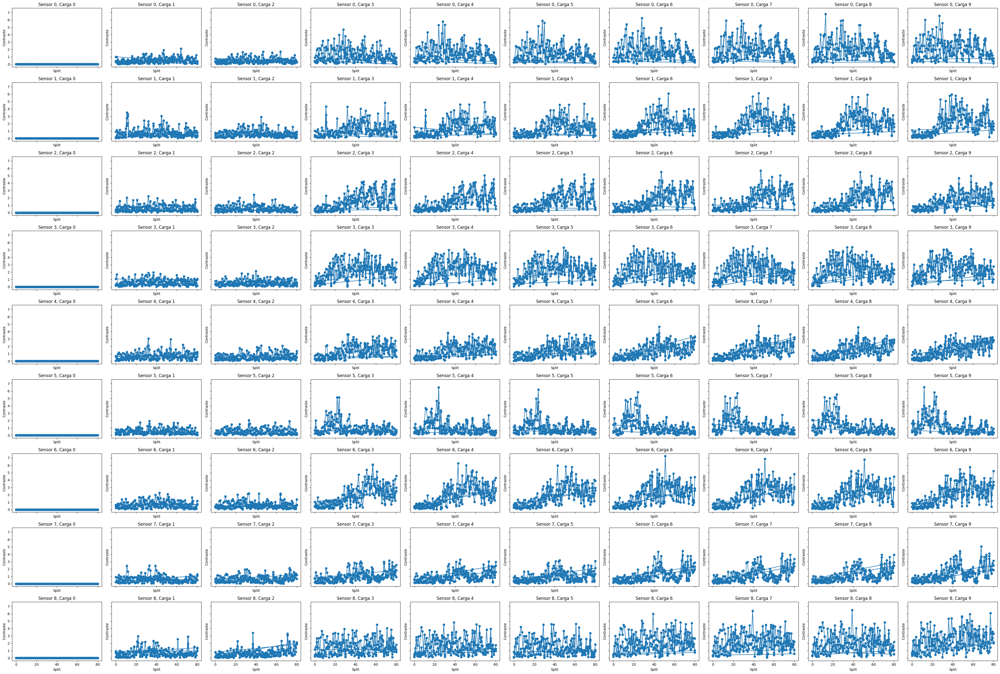

In [24]:
def plot_contraste_vs_split(datos_contraste):
    sensores = datos_contraste['sensor'].unique()
    cargas = datos_contraste['ensayo'].unique()
    
    fig, axes = plt.subplots(len(sensores), len(cargas), 
                             figsize=(4*len(cargas), 3*len(sensores)), 
                             sharex=True, sharey=True)

    if len(sensores) == 1:
        axes = [axes]
    if len(cargas) == 1:
        axes = [[ax] for ax in axes]

    for i, sensor in enumerate(sensores):
        for j, carga in enumerate(cargas):
            ax = axes[i][j]
            subset = datos_contraste[(datos_contraste['sensor']==sensor) & 
                                     (datos_contraste['ensayo']==carga)]
            ax.plot(subset['split'], subset['distancia_baseline'], marker='o')
            ax.set_title(f"Sensor {sensor}, Carga {carga}")
            ax.set_xlabel("Split")
            ax.set_ylabel("Contraste")

    plt.tight_layout()
    plt.show()

plot_contraste_vs_split(datos_contraste)

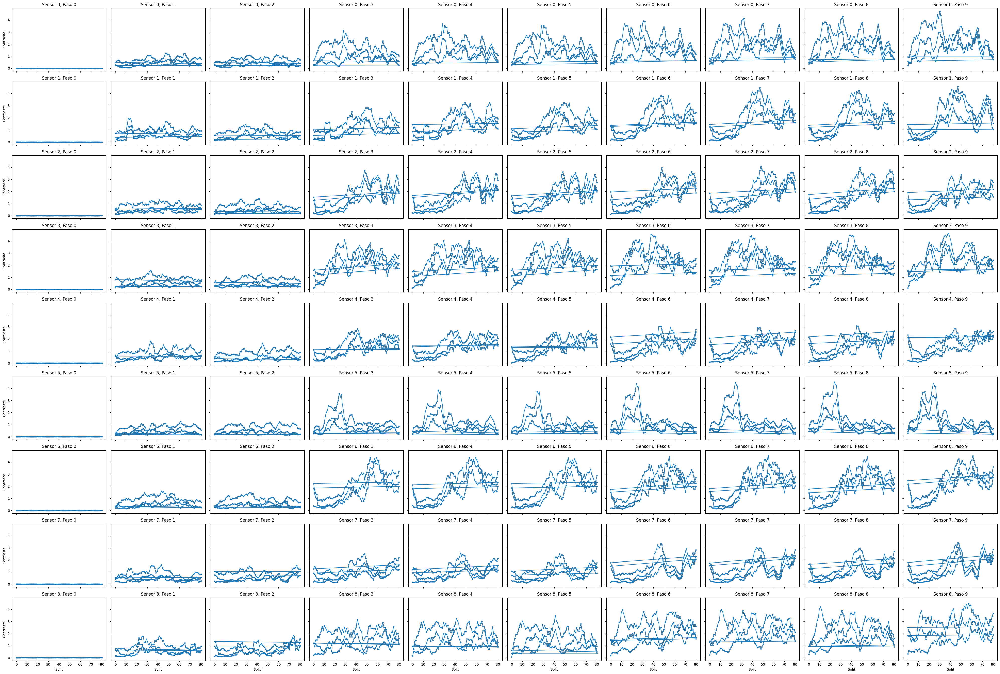

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1️⃣ Curvas suavizadas
def plot_curvas_suavizadas(datos_contraste, window=5):
    """
    Dibuja curvas de contraste vs split suavizadas con rolling mean.
    Filas = sensores, Columnas = paso-carga.
    """
    datos_suave = datos_contraste.copy()
    # Suavizado por sensor + paso_carga
    datos_suave['contraste_suavizado'] = datos_suave.groupby(['sensor', 'ensayo'])['distancia_baseline']\
        .transform(lambda x: x.rolling(window=window, min_periods=1).mean())

    sensores = datos_suave['sensor'].unique()
    pasos = datos_suave['ensayo'].unique()

    fig, axes = plt.subplots(len(sensores), len(pasos), figsize=(4*len(pasos), 3*len(sensores)), sharex=True, sharey=True)

    if len(sensores) == 1 and len(pasos) == 1:
        axes = [[axes]]
    elif len(sensores) == 1:
        axes = [axes]
    elif len(pasos) == 1:
        axes = [[ax] for ax in axes]

    for i, sensor in enumerate(sensores):
        for j, paso in enumerate(pasos):
            ax = axes[i][j]
            subset = datos_suave[(datos_suave['sensor'] == sensor) & (datos_suave['ensayo'] == paso)]
            ax.plot(subset['split'], subset['contraste_suavizado'], marker='o', linestyle='-', markersize=3)
            ax.set_title(f"Sensor {sensor}, Paso {paso}")
            if i == len(sensores)-1:
                ax.set_xlabel("Split")
            if j == 0:
                ax.set_ylabel("Contraste")

    plt.tight_layout()
    plt.show()


# 🔹 Uso
plot_curvas_suavizadas(datos_contraste, window=5)


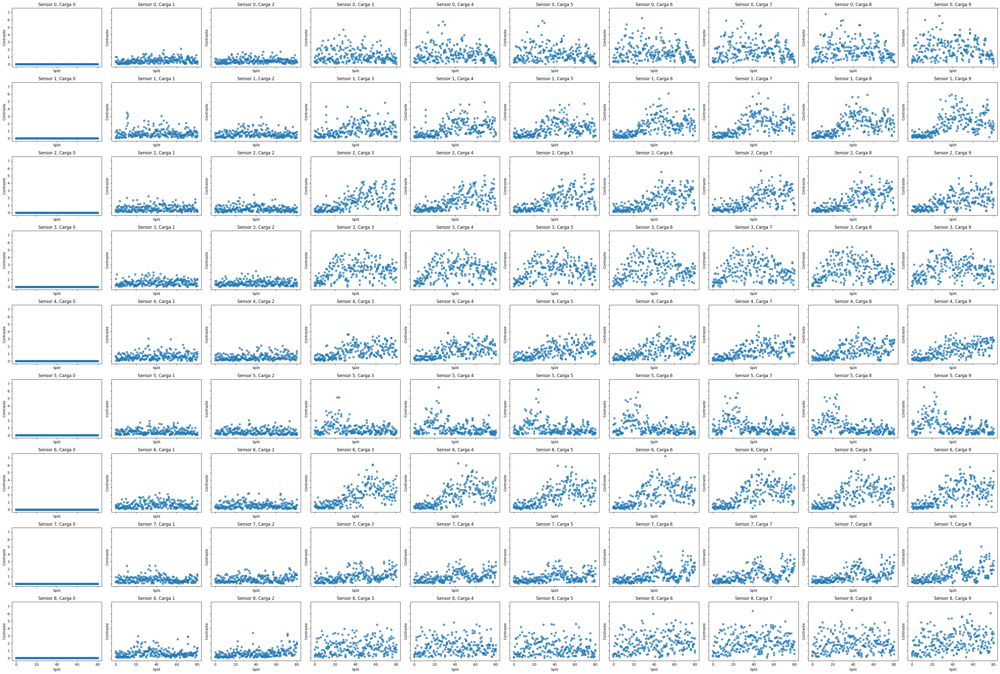

In [26]:
def plot_contraste_vs_split_dispersion(datos_contraste):
    sensores = datos_contraste['sensor'].unique()
    cargas = datos_contraste['ensayo'].unique()
    
    fig, axes = plt.subplots(len(sensores), len(cargas),
                             figsize=(4*len(cargas), 3*len(sensores)),
                             sharex=True, sharey=True)

    if len(sensores) == 1:
        axes = [axes]
    if len(cargas) == 1:
        axes = [[ax] for ax in axes]

    for i, sensor in enumerate(sensores):
        for j, carga in enumerate(cargas):
            ax = axes[i][j]
            subset = datos_contraste[(datos_contraste['sensor']==sensor) &
                                     (datos_contraste['ensayo']==carga)]
            
            ax.scatter(subset['split'], subset['distancia_baseline'], s=30, alpha=0.7)
            
            ax.set_title(f"Sensor {sensor}, Carga {carga}")
            ax.set_xlabel("Split")
            ax.set_ylabel("Contraste")

    plt.tight_layout()
    plt.show()
    
plot_contraste_vs_split_dispersion(datos_contraste)

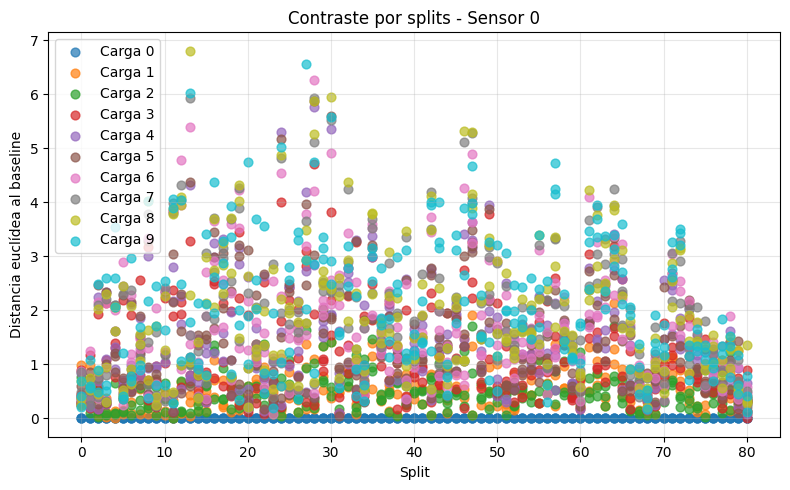

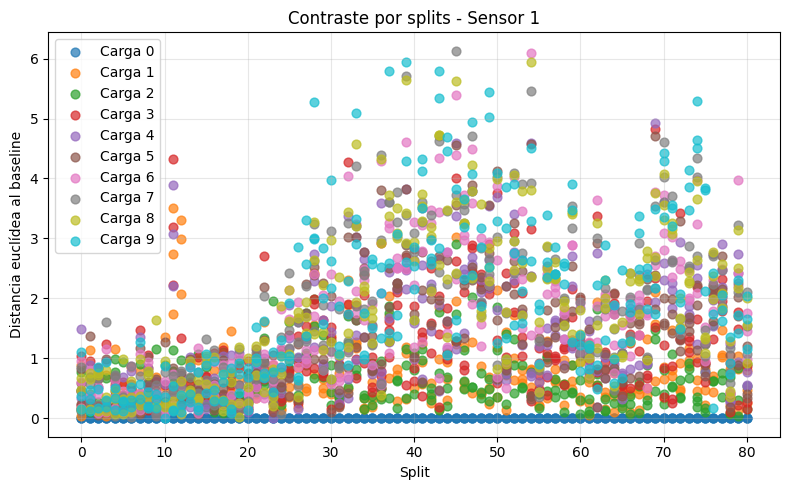

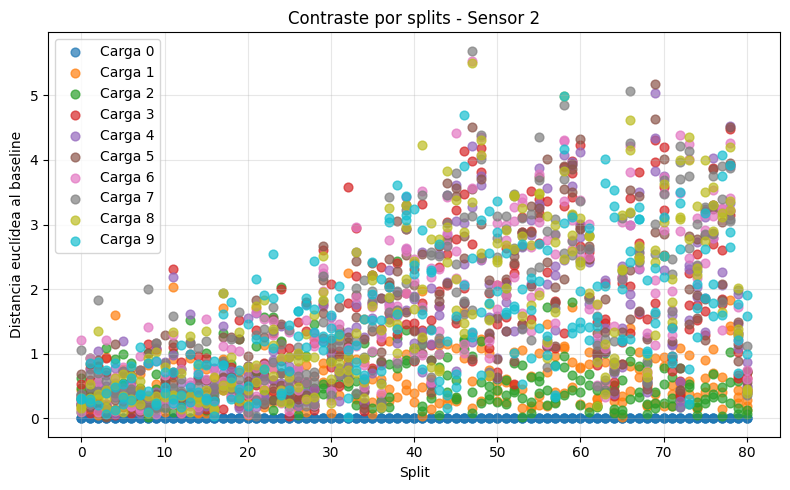

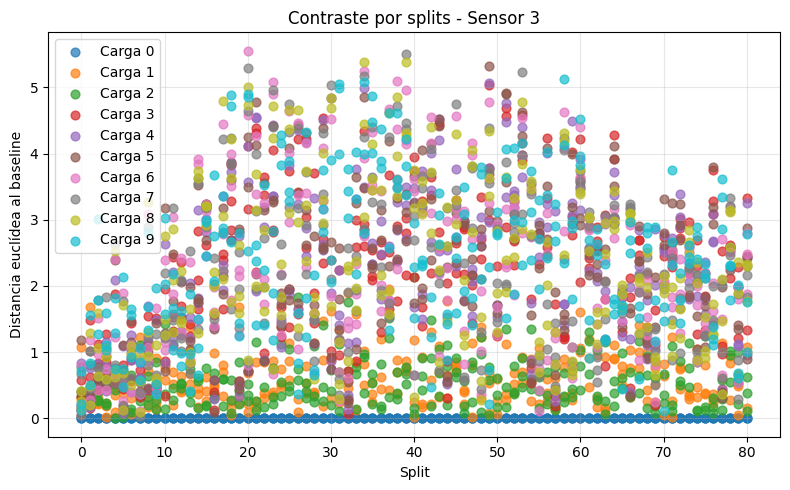

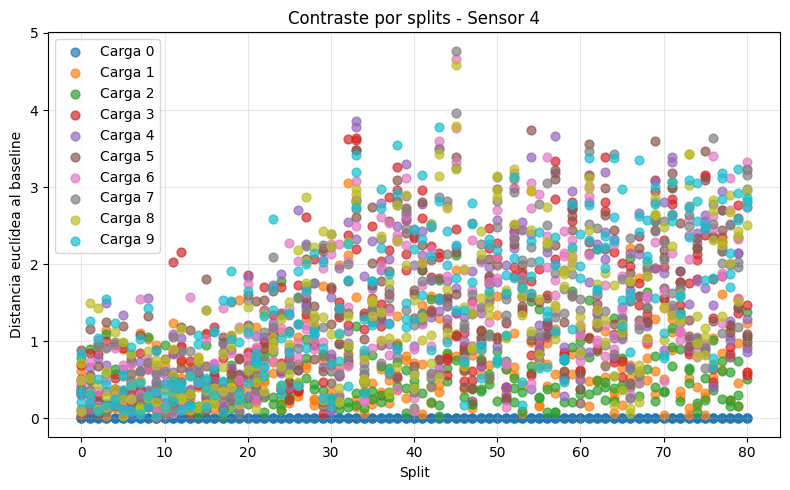

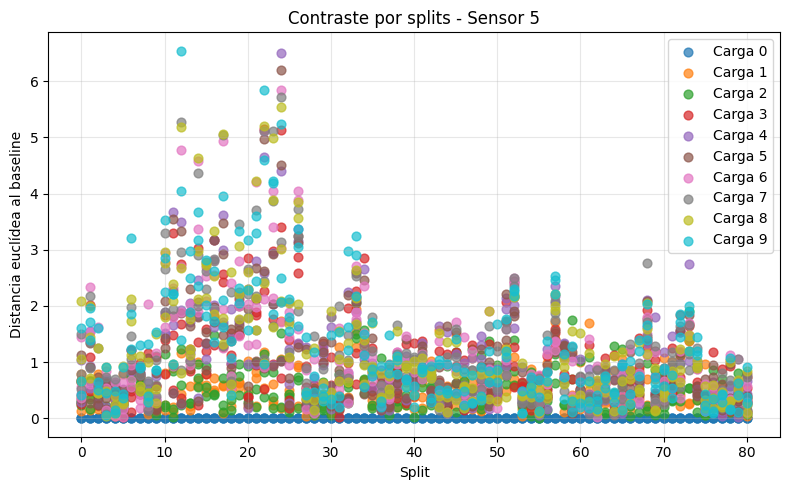

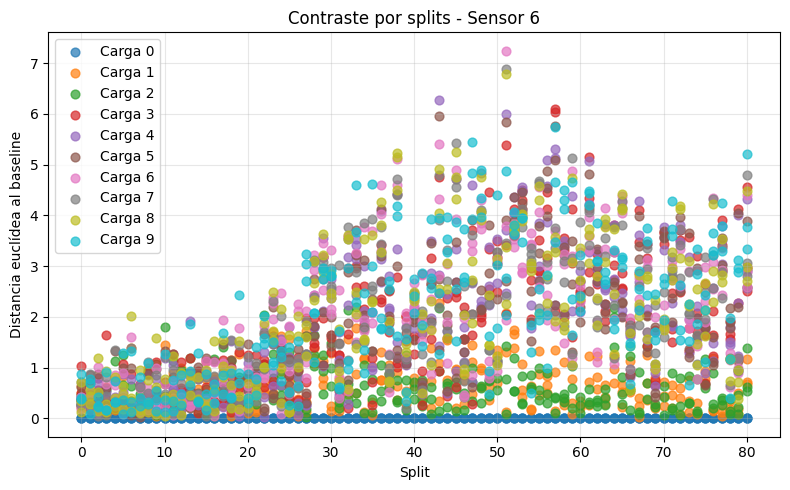

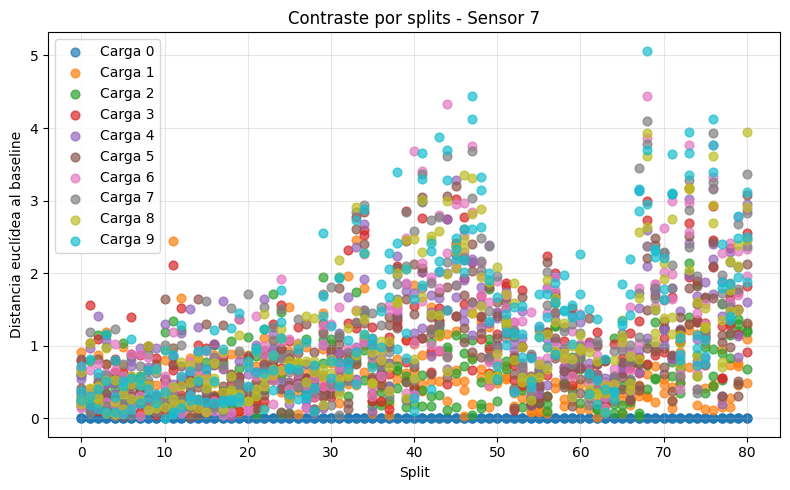

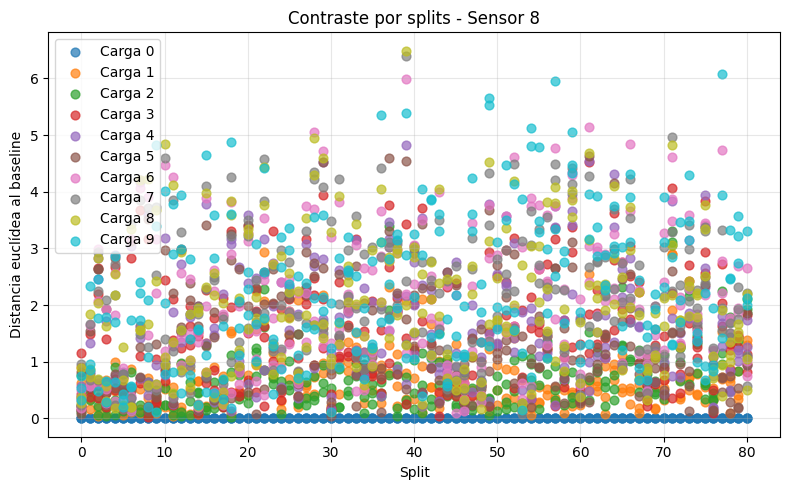

In [27]:
def plot_contraste_por_sensor_puntos(datos_contraste):
    sensores = datos_contraste['sensor'].unique()
    for sensor in sensores:
        subset = datos_contraste[datos_contraste['sensor'] == sensor]
        plt.figure(figsize=(8,5))

        for carga in sorted(subset['ensayo'].unique()):
            sub_carga = subset[subset['ensayo'] == carga].sort_values('split')
            x = sub_carga['split'].values
            y = sub_carga['distancia_baseline'].values
            plt.scatter(x, y, s=40, alpha=0.7, label=f"Carga {carga}")  # puntos

        plt.title(f"Contraste por splits - Sensor {sensor}")
        plt.xlabel("Split")
        plt.ylabel("Distancia euclídea al baseline")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

plot_contraste_por_sensor_puntos(datos_contraste)

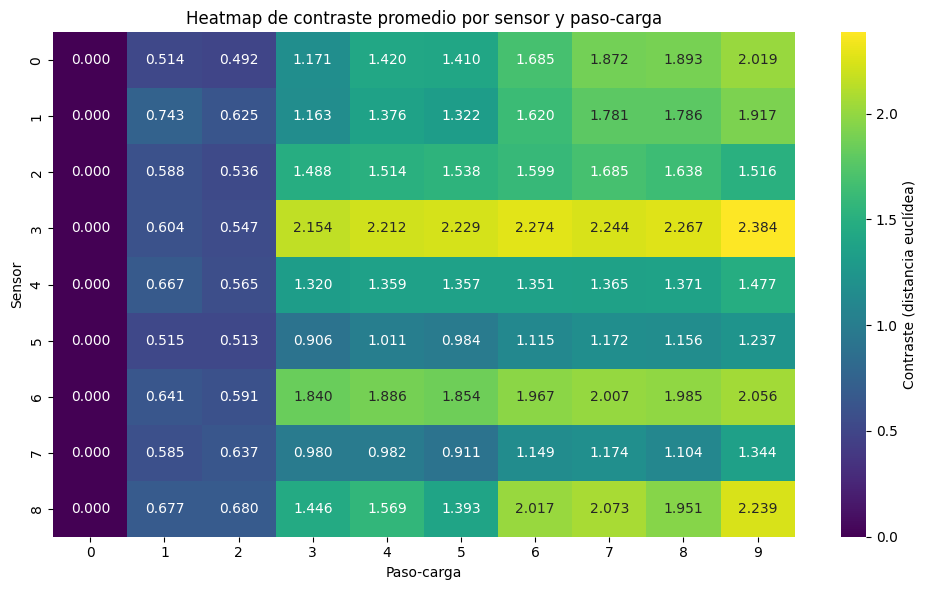

In [28]:
import seaborn as sns

def plot_heatmap(datos_contraste):
    """
    Heatmap de contraste promedio por sensor (filas) y paso-carga (columnas).
    
    datos_contraste: DataFrame con columnas ['sensor', 'paso_carga', 'split', 'contraste']
    """
    # Promediamos contraste a lo largo de los splits
    df_avg = datos_contraste.groupby(['sensor', 'ensayo'])['distancia_baseline'].mean().reset_index()
    
    # Pivot para formato heatmap: filas = sensor, columnas = paso_carga, valores = contraste promedio
    df_pivot = df_avg.pivot(index='sensor', columns='ensayo', values='distancia_baseline')
    
    plt.figure(figsize=(10, 6))
    sns.heatmap(df_pivot, annot=True, fmt=".3f", cmap='viridis', cbar_kws={'label': 'Contraste (distancia euclídea)'})
    plt.title('Heatmap de contraste promedio por sensor y paso-carga')
    plt.ylabel('Sensor')
    plt.xlabel('Paso-carga')
    plt.tight_layout()
    plt.show()

# 🔹 Uso
plot_heatmap(datos_contraste)
